## Prevalance of Chronic Diseases in the United States

### Background and Motivation 

Chronic diseases are the primary cause of death and disability in the United States.[1][2]

According to the CDC's National Center for Health Statistics, heart diseases, cancers, strokes, respiratory disorders, diabetes, and kidney diseases were among the top ten leading causes of death in the United States for the year 2021.[3] 

These conditions not only affect health but also carry a substantial economic burden, with the cost of chronic disease expected to reach $47 trillion worldwide by 2030.[2]

There is a need for targeted interventions and public health strategies that can help mitigate chronic diseases. 

Therefore, understanding the prevalence of these chronic conditions across various locations in the US is crucial.

### Data Source:

Dataset is sourced from CDC PLACES, 2024 release.

Data reflects 2022 prevalence rates for most chronic conditions.

High Blood Pressure and Cholesterol data are based on 2021 rates.

Includes crude prevalence rates for chronic conditions across all 50 U.S. states, and the District of Columbia at county, place, census tract, and ZIP Code Tabulation Area levels.


### Objective 1: 

Provide a national overview of chronic disease prevalence across U.S. states.

Visualize county-level prevalence of key chronic diseases.

Chronic conditions include:  Arthritis, High Blood Pressure, Cancer, Asthma, CHD, COPD, Depression, Diabetes, High Cholesterol, Stroke, and Obesity among adults >18 years of age


In [3]:
# Importing necessary libraries and dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from typing import List

In [4]:
# loading in the dataset

CDC_2024 = pd.read_csv('PLACES__Census_Tract_Data__GIS_Friendly_Format___2024_release.xls')
CDC_2024.head(3)

,StateAbbr,StateDesc,CountyName,CountyFIPS,TractFIPS,TotalPopulation,TotalPop18plus,ACCESS2_CrudePrev,ACCESS2_Crude95CI,ARTHRITIS_CrudePrev,...,FOODINSECU_Crude95CI,HOUSINSECU_CrudePrev,HOUSINSECU_Crude95CI,SHUTUTILITY_CrudePrev,SHUTUTILITY_Crude95CI,LACKTRPT_CrudePrev,LACKTRPT_Crude95CI,EMOTIONSPT_CrudePrev,EMOTIONSPT_Crude95CI,Geolocation
0,AL,Alabama,Autauga,1001,1001020100,1775,1370,11.2,"( 8.7, 14.2)",35.2,...,"(14.9, 18.6)",14.2,"(12.5, 16.0)",9.3,"( 8.1, 10.6)",9.7,"( 8.8, 10.7)",25.9,"(22.4, 29.7)",POINT (-86.4915648 32.4819731)
1,AL,Alabama,Autauga,1001,1001020200,2055,1584,10.7,"( 8.6, 12.9)",32.3,...,"(19.1, 23.5)",19.1,"(17.1, 21.3)",12.1,"(10.7, 13.8)",11.4,"(10.4, 12.6)",30.7,"(27.0, 34.9)",POINT (-86.4724678 32.475758)
2,AL,Alabama,Autauga,1001,1001020300,3216,2485,10.9,"( 8.7, 13.5)",35.7,...,"(15.2, 18.9)",15.0,"(13.3, 16.8)",9.8,"( 8.7, 11.2)",9.8,"( 9.0, 10.9)",25.9,"(22.4, 29.6)",POINT (-86.4597033 32.4740243)


### Exploratory data analysis

In [6]:
# Number of rows and columns
rows, columns = CDC_2024.shape
print(f"Number of rows: {rows}")
print(f"Number of columns: {columns}")

Number of rows: 83522
Number of columns: 88


In [7]:
# Number of unique states, counties, and census tracts
num_states = CDC_2024['StateAbbr'].nunique()
num_counties = CDC_2024['CountyFIPS'].nunique()
num_census_tracts = CDC_2024['TractFIPS'].nunique()

print(f"Number of unique states: {num_states}")
print(f"Number of unique counties (FIPS): {num_counties}")
print(f"Number of unique census tracts: {num_census_tracts}")

Number of unique states: 51
Number of unique counties (FIPS): 3143
Number of unique census tracts: 83522


### Missing values

In [9]:
# List of disease-related columns
disease_columns = [
    'ARTHRITIS_CrudePrev', 'BPHIGH_CrudePrev', 'CANCER_CrudePrev',
    'CASTHMA_CrudePrev', 'CHD_CrudePrev', 'COPD_CrudePrev',
    'DEPRESSION_CrudePrev', 'DIABETES_CrudePrev', 'HIGHCHOL_CrudePrev',
    'STROKE_CrudePrev', 'OBESITY_CrudePrev'
]

# Check for missing values in these columns
disease_missing_values = CDC_2024[disease_columns].isnull().sum().reset_index()
disease_missing_values.columns = ['Column', 'Missing Values']
disease_missing_values['Missing Percentage'] = (disease_missing_values['Missing Values'] / len(CDC_2024)) * 100

# Display missing values for disease-related columns
print(disease_missing_values)

                  Column  Missing Values  Missing Percentage
0    ARTHRITIS_CrudePrev               0            0.000000
1       BPHIGH_CrudePrev            5077            6.078638
2       CANCER_CrudePrev               0            0.000000
3      CASTHMA_CrudePrev               0            0.000000
4          CHD_CrudePrev               0            0.000000
5         COPD_CrudePrev               0            0.000000
6   DEPRESSION_CrudePrev               0            0.000000
7     DIABETES_CrudePrev               0            0.000000
8     HIGHCHOL_CrudePrev            5077            6.078638
9       STROKE_CrudePrev               0            0.000000
10     OBESITY_CrudePrev               0            0.000000


In [10]:
# Filter rows where any of the disease-related columns have missing values
missing_disease_data = CDC_2024[CDC_2024[disease_columns].isnull().any(axis=1)]

# Group by StateDesc and count the number of missing rows per state
missing_states = missing_disease_data.groupby('StateDesc').size().reset_index(name='Missing Rows')

# Display states with missing values
print(missing_states)

  StateDesc  Missing Rows
0   Florida          5077


#### In the visualizations, these values were handled using annotations and distinct color to represent missing data for Florida

### Descriptive Statistics

#### Bar chart : weighted mean prevalence of chronic conditions (highest to lowest). 

In [13]:
# Define the conditions
conditions = {
    'ARTHRITIS_CrudePrev': 'Arthritis',
    'BPHIGH_CrudePrev': 'High BP',
    'CANCER_CrudePrev': 'Cancer',
    'CASTHMA_CrudePrev': 'Asthma',
    'CHD_CrudePrev': 'CHD',
    'COPD_CrudePrev': 'COPD',
    'DEPRESSION_CrudePrev': 'Depression',
    'DIABETES_CrudePrev': 'Diabetes',
    'HIGHCHOL_CrudePrev': 'High Cholesterol',
    'STROKE_CrudePrev': 'Stroke',
    'OBESITY_CrudePrev': 'Obesity'
}

# Replace missing values with 0 and calculate weighted prevalence
def replace_missing_and_calculate_weighted_prevalence(df, conditions):
    # Replace missing values in relevant condition columns with 0
    df_filled = df.copy()
    for cond in conditions:
        df_filled[cond] = pd.to_numeric(df_filled[cond], errors='coerce').fillna(0)
    df_filled['TotalPopulation'] = pd.to_numeric(df_filled['TotalPopulation'], errors='coerce').fillna(0)

    # Group by StateAbbr and calculate weighted prevalence for each condition
    weighted_prevalence = df_filled.groupby('StateAbbr').apply(
        lambda group: {
            condition: (group[cond] * group['TotalPopulation']).sum() / group['TotalPopulation'].sum()
            for cond, condition in conditions.items()
        }
    ).reset_index(name='WeightedPrevalence')

    # Flatten results for easier readability
    weighted_df = pd.DataFrame(weighted_prevalence['WeightedPrevalence'].tolist(), index=weighted_prevalence['StateAbbr'])
    weighted_df.reset_index(inplace=True)
    weighted_df.rename(columns={'index': 'StateAbbr'}, inplace=True)

    return weighted_df

# Apply the function to the CDC_2024 dataset
weighted_prevalence_df = replace_missing_and_calculate_weighted_prevalence(CDC_2024, conditions)

# Display the resulting dataframe
weighted_prevalence_df.head()

C:\Users\krant\AppData\Local\Temp\ipykernel_2336\3252174479.py:25: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_prevalence = df_filled.groupby('StateAbbr').apply(


,StateAbbr,Arthritis,High BP,Cancer,Asthma,CHD,COPD,Depression,Diabetes,High Cholesterol,Stroke,Obesity
0,AK,24.054930,29.470273,6.823954,10.925605,6.157722,6.452861,21.854486,9.162897,30.734220,3.285946,32.513220
1,AL,32.990492,41.295370,8.242225,10.684174,8.246701,8.997576,24.567941,14.767838,37.135474,4.407516,39.450246
2,AR,32.075020,40.320932,8.425217,11.194297,8.699303,9.434960,27.048616,14.796316,36.798115,4.378158,38.289687
3,AZ,26.220199,30.911721,8.582396,10.646445,7.074845,7.294766,21.947219,12.356492,33.906818,3.646400,33.606327
4,CA,20.843605,28.337695,6.654976,9.864282,5.721837,5.526532,21.100417,11.577904,34.013749,3.186514,28.562849


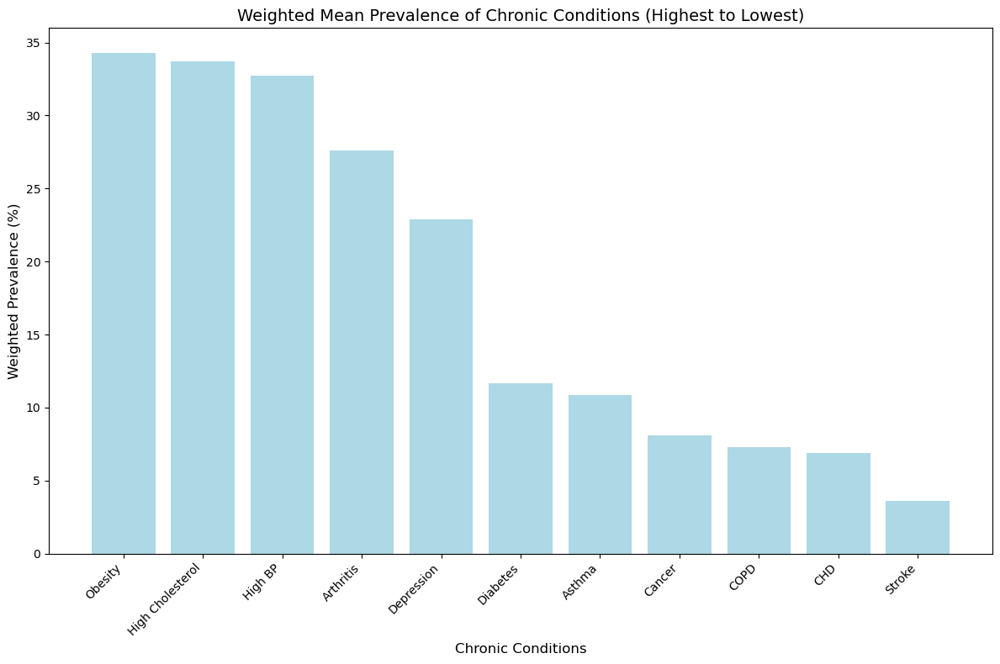

In [14]:
# Exclude non-numeric columns, e.g., 'StateAbbr'
numeric_columns = weighted_prevalence_df.select_dtypes(include='number')

# Calculate the average weighted prevalence across all states for each condition
average_prevalence = numeric_columns.mean(axis=0).sort_values(ascending=False)

# Plot the bar chart
plt.figure(figsize=(12, 8))
plt.bar(average_prevalence.index, average_prevalence.values, color='lightblue')
plt.title('Weighted Mean Prevalence of Chronic Conditions (Highest to Lowest)', fontsize=14)
plt.xlabel('Chronic Conditions', fontsize=12)
plt.ylabel('Weighted Prevalence (%)', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.tight_layout()

# Display the chart
plt.show()

#### Comparison of Highest and Lowest Weighted Prevalence of Chronic Condition

In [16]:
# Find the highest and lowest weighted prevalence for each condition
numeric_columns = weighted_prevalence_df.select_dtypes(include='number')

# Find the highest and lowest prevalence for each condition
highest_prevalence = numeric_columns.max()
lowest_prevalence = numeric_columns.min()

# Combine into a single DataFrame for better readability
prevalence_summary = pd.DataFrame({
    'Condition': numeric_columns.columns,
    'Highest Prevalence': highest_prevalence.values,
    'Lowest Prevalence': lowest_prevalence.values
})

# Display the prevalence summary
print(prevalence_summary)

           Condition  Highest Prevalence  Lowest Prevalence
0          Arthritis           38.499546          18.064846
1            High BP           44.502679           0.000000
2             Cancer            9.850382           5.521473
3             Asthma           12.528426           9.255051
4                CHD            9.514853           4.231652
5               COPD           12.191945           4.526565
6         Depression           29.603629          15.041581
7           Diabetes           15.914734           8.234619
8   High Cholesterol           39.981651           0.000000
9             Stroke            4.809982           2.613367
10           Obesity           41.381878          25.156697


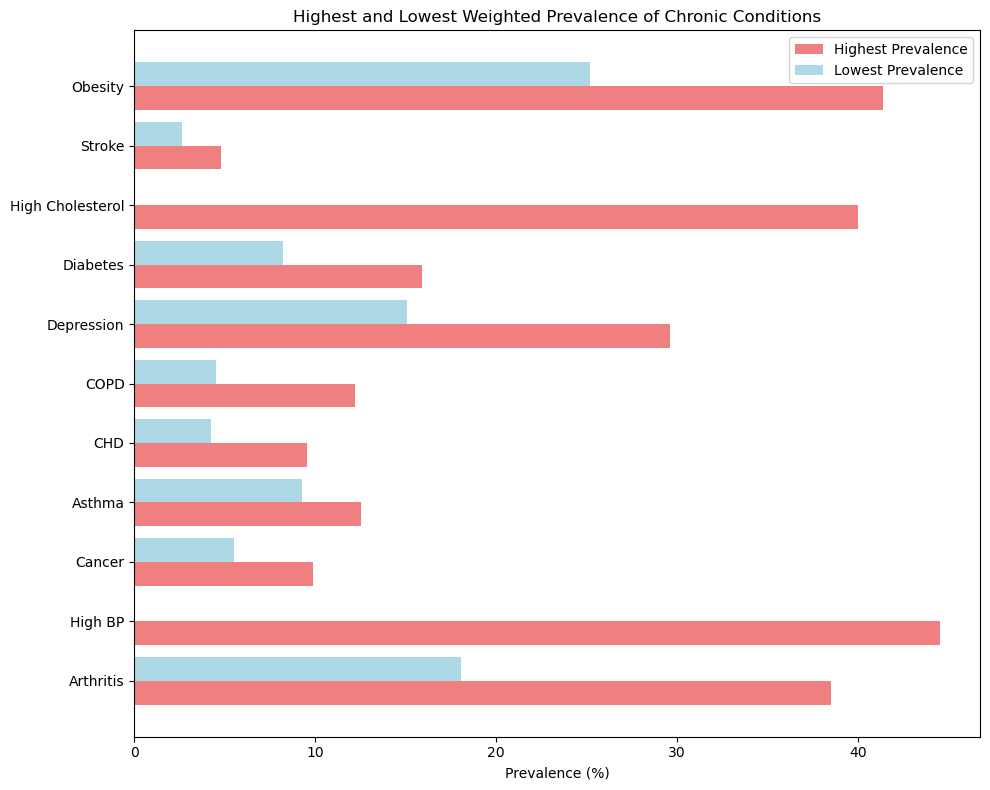

In [17]:
# Data for plotting
conditions = prevalence_summary['Condition']
highest = prevalence_summary['Highest Prevalence']
lowest = prevalence_summary['Lowest Prevalence']

# Plot settings
fig, ax = plt.subplots(figsize=(10, 8))
y = np.arange(len(conditions))  # Y-axis positions

# Horizontal bars
ax.barh(y - 0.2, highest, height=0.4, label='Highest Prevalence', color='lightcoral')
ax.barh(y + 0.2, lowest, height=0.4, label='Lowest Prevalence', color='lightblue')

# Labels and Formatting
ax.set_yticks(y)
ax.set_yticklabels(conditions)
ax.set_xlabel('Prevalence (%)')
ax.set_title('Highest and Lowest Weighted Prevalence of Chronic Conditions')
ax.legend()

# Layout and display
plt.tight_layout()
plt.show()

#### 


### Choropleth Maps: Showing Prevalence Rates Across Different US States

In [20]:
def chronic_disease_choropleth(
    df: pd.DataFrame,
    measures: List[str],
    display_names: dict
) -> go.Figure:
    """
    Creates an interactive choropleth map of chronic diseases using Plotly, adjusted for population weighting.
    
    Parameters:
    -----------
    df : pd.DataFrame
        CDC_2024 dataset
    measures : List[str]
        List of chronic diseases to visualize
    display_names : dict
        Dictionary mapping measure names to display names
    
    Returns:
    --------
    fig : go.Figure
        Interactive Plotly figure
    """
    # Validate input data
    required_columns = ['StateDesc', 'StateAbbr', 'TotalPopulation'] + measures
    missing_columns = [col for col in required_columns if col not in df.columns]
    if missing_columns:
        raise ValueError(f"Missing required columns: {', '.join(missing_columns)}")
    
    # Convert non-numeric values to NaN for measures
    df[measures] = df[measures].apply(pd.to_numeric, errors='coerce')

    # Filter out rows with zero or missing TotalPopulation
    df = df[df['TotalPopulation'] > 0]

    # Calculate state-level population-weighted prevalence rates
    state_stats = (
        df.groupby(['StateDesc', 'StateAbbr'])
        .apply(
            lambda group: pd.Series({
                measure: (group[measure] * group['TotalPopulation']).sum() / group['TotalPopulation'].sum()
                if not group[measure].isna().all() else np.nan
                for measure in measures
            })
        )
        .reset_index()
    )

    # Create figure
    fig = go.Figure()
    
    # Add traces for each measure
    for measure in measures:
        min_val = state_stats[measure].min(skipna=True)  # Minimum value for scaling
        max_val = state_stats[measure].max(skipna=True)  # Maximum value for scaling
        
        fig.add_trace(
            go.Choropleth(
                locations=state_stats['StateAbbr'],
                z=state_stats[measure],
                locationmode='USA-states',
                colorscale=[
                    [0.0, 'rgb(198,219,239)'],  # Light blue for low values
                    [0.5, 'rgb(107,174,214)'],  # Medium blue for middle values
                    [1.0, 'rgb(8,81,156)']      # Dark blue for high values
                ],
                name=display_names[measure],
                zmin=min_val,
                zmax=max_val,  # Dynamic max for each measure
                visible=True if measure == measures[0] else False,
                colorbar_title="Prevalence (%)",
                hovertemplate=(
                    "<b>%{location}</b><br>" +
                    "Prevalence: %{z:.1f}%<br>" +
                    "<extra></extra>"
                ),
            )
        )

    # Add dropdown menu for interactivity
    fig.update_layout(
        title={
            'text': 'Chronic Disease Prevalence Across the United States (Population-Weighted)',
            'x': 0.5,
            'xanchor': 'center',
            'font': {'size': 24}
        },
        geo=dict(
            scope='usa',
            projection_type='albers usa',
            showlakes=True,
            lakecolor='rgb(255, 255, 255)'
        ),
        width=1000,
        height=600,
        updatemenus=[{
            'buttons': [
                {
                    'method': 'update',
                    'label': display_names[measure],
                    'args': [
                        {'visible': [i == j for j in range(len(measures))]},
                        {
                            'title': f'Prevalence of {display_names[measure]} across the United States',
                            'annotations': [
                                {
                                    'text': "Data is not available for Florida",
                                    'showarrow': False,
                                    'xref': "paper",
                                    'yref': "paper",
                                    'x': 0.5,
                                    'y': -0.1,
                                    'font': {'size': 15},
                                    'align': 'center'
                                }
                            ] if measure in ['BPHIGH_CrudePrev', 'HIGHCHOL_CrudePrev'] else []
                        }
                    ]
                } for i, measure in enumerate(measures)
            ],
            'direction': 'down',
            'showactive': True,
            'x': 0.1,
            'y': 1.1
        }]
    )

    return fig

# Define the variables
variables = [
    'ARTHRITIS_CrudePrev', 'BPHIGH_CrudePrev', 'CANCER_CrudePrev', 
    'CASTHMA_CrudePrev', 'CHD_CrudePrev', 'COPD_CrudePrev', 
    'DEPRESSION_CrudePrev', 'DIABETES_CrudePrev', 'HIGHCHOL_CrudePrev', 
    'STROKE_CrudePrev', 'OBESITY_CrudePrev'
]

# Define display names for variables
display_names = {
    'ARTHRITIS_CrudePrev': 'Arthritis',
    'BPHIGH_CrudePrev': 'High Blood Pressure',
    'CANCER_CrudePrev': 'Cancer',
    'CASTHMA_CrudePrev': 'Asthma',
    'CHD_CrudePrev': 'Coronary Heart Disease',
    'COPD_CrudePrev': 'Chronic Obstructive Pulmonary Disease',
    'DEPRESSION_CrudePrev': 'Depression',
    'DIABETES_CrudePrev': 'Diabetes',
    'HIGHCHOL_CrudePrev': 'High Cholesterol',
    'STROKE_CrudePrev': 'Stroke',
    'OBESITY_CrudePrev': 'Obesity'
}

# Create and display the choropleth
choropleth = chronic_disease_choropleth(CDC_2024, variables, display_names)
choropleth.show()

C:\Users\krant\AppData\Local\Temp\ipykernel_2336\305114685.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(


### Issue Identified:
White spots, resembling the size of a county, are visible on the choropleth map. 

Suspected that the issue could to be related to problems with geographic boundary definitions or the JSON file used in the map.

Test with Plotly’s Built-In JSON File: The built-in state boundary JSON file from Plotly was used to render the choropleth map. However, the white spots still persisted.

Test with External CDC File: The 2024 TIGER/Line® Shapefiles from the CDC were downloaded and integrated into the map rendering logic. Despite this, the white spots remained visible.

Verification of original dataset: Missing Values: CDC_2024 dataset revealed missing values in Florida for the High Blood Pressure (BPHIGH) and High Cholesterol (HIGHCHOL) columns. No missing values were found for any other state. Ensured no rows were excluded due to filtering logic (e.g., TotalPopulation > 0). The dataset size before and after filtering was identical.
Also checked grouping logic and confirmed that all states were accounted for in the grouping logic. No states were omitted during processing.

The persistence of white spots across both GeoJSON sources may be due to data incompleteness. Specifically, certain counties may lack data entirely, resulting in these areas being unrepresented on the map.

### Choropleth Maps: Showing Prevalence Rates Across Different US States (County-level)

C:\Users\krant\AppData\Local\Temp\ipykernel_2336\108477166.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



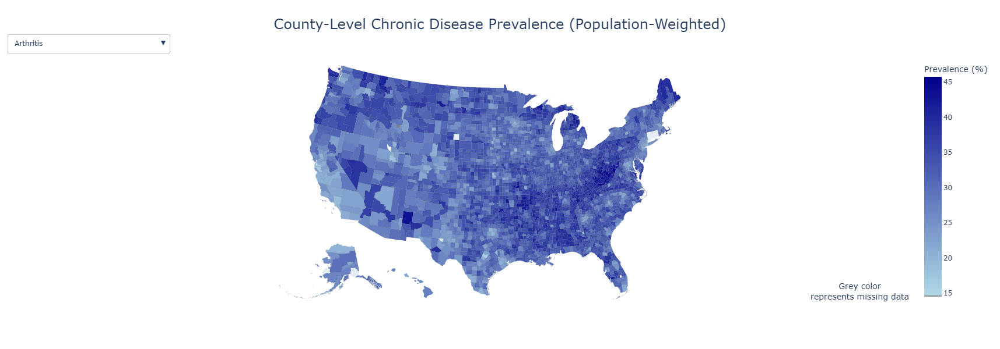

In [25]:
def create_county_health_choropleth(
    df: pd.DataFrame,
    measures: List[str],
    display_names: dict
) -> go.Figure:
    """
    Creates an interactive county-level choropleth map of health outcomes using Plotly, adjusted for population weighting.

    Parameters:
    -----------
    df : pd.DataFrame
        CDC_2024 dataset
    measures : List[str]
        List of health measures to visualize
    display_names : dict
        Dictionary mapping measure names to display names

    Returns:
    --------
    fig : go.Figure
        Interactive Plotly figure5
    """
    # Calculate county-level population-weighted prevalence rates
    county_stats = (
        df.groupby(['CountyName', 'CountyFIPS'])
        .apply(
            lambda group: pd.Series({
                measure: (group[measure] * group['TotalPopulation']).sum() / group['TotalPopulation'].sum()
                for measure in measures
            })
        )
        .reset_index()
    )

    # Ensure CountyFIPS is a string for mapping purposes
    county_stats['CountyFIPS'] = county_stats['CountyFIPS'].astype(str).str.zfill(5)

    # Add a column to handle missing values
    for measure in measures:
        county_stats[f"{measure}_Tooltip"] = county_stats[measure].apply(
            lambda x: "Missing Data" if pd.isna(x) else f"{x:.1f}%"
        )

    # Create figure
    fig = go.Figure()

    # Add choropleth traces for each measure
    for measure in measures:
        # Define a custom colorscale where missing data is represented as grey
        colorscale = [
            [0.0, 'grey'],        # Grey for missing data
            [0.01, 'lightblue'],  # Minimum value
            [1.0, 'darkblue']     # Maximum value
        ]

        fig.add_trace(
            go.Choropleth(
                geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',  # Used external GeoJSON file
                locations=county_stats['CountyFIPS'],  # FIPS codes for counties
                z=county_stats[measure],  # Population-weighted prevalence
                locationmode='geojson-id',  # Match FIPS codes with GeoJSON
                colorscale=colorscale,  # Custom colorscale
                name=display_names[measure],  # Display name for the disease
                zmin=county_stats[measure].min(skipna=True),  # Ignore NaN values for minimum
                zmax=county_stats[measure].max(skipna=True),  # Ignore NaN values for maximum
                visible=True if measure == measures[0] else False,  # Only show the first measure by default
                colorbar_title="Prevalence (%)",  # Title for the colorbar
                customdata=county_stats[['CountyName', f"{measure}_Tooltip"]],  # Pass CountyName and tooltip data
                marker=dict(
                    line=dict(
                        width=0.08,  # Thinner borders
                        color='black'  # Border color
                    )
                ),
                hovertemplate=(
                    "<b>%{customdata[0]}</b><br>" +  # Use customdata for CountyName
                    "%{customdata[1]}<br>" +  # Use formatted prevalence or "Missing Data"
                    "<extra></extra>"
                )
            )
        )

    # Add dropdown menu for interactivity and annotation for grey
    fig.update_layout(
        title={
            'text': 'County-Level Chronic Disease Prevalence (Population-Weighted)',
            'x': 0.5,
            'xanchor': 'center',
            'font': {'size': 24}
        },
        geo=dict(
            scope='usa',
            projection_type='albers usa',
            showlakes=True,
            lakecolor='rgb(255, 255, 255)'
        ),
        width=1000,
        height=600,
        updatemenus=[{
            'buttons': [
                {
                    'method': 'update',
                    'label': display_names[measure],
                    'args': [
                        {'visible': [i == j for j in range(len(measures))]},
                        {'title': f'Prevalence of {display_names[measure]} by County, accross the United States'}
                    ]
                } for i, measure in enumerate(measures)
            ],
            'direction': 'down',
            'showactive': True,
            'x': 0.1,
            'y': 1.1
        }],
        annotations=[
            dict(
                x=1.01,  # Align to the center of the color scale
                y=0,  # Position directly below the color scale
                text="Grey color<br>represents missing data",  # Two-line annotation
                showarrow=False,
                xref="paper",
                yref="paper",
                font=dict(size=14),
                align="center"
            )
        ]
    )

    return fig

# Define the variables
variables = [
    'ARTHRITIS_CrudePrev', 'BPHIGH_CrudePrev', 'CANCER_CrudePrev', 
    'CASTHMA_CrudePrev', 'CHD_CrudePrev', 'COPD_CrudePrev', 
    'DEPRESSION_CrudePrev', 'DIABETES_CrudePrev', 'HIGHCHOL_CrudePrev', 
    'STROKE_CrudePrev', 'OBESITY_CrudePrev'
]

# Define display names for the dropdown
display_names = {
    'ARTHRITIS_CrudePrev': 'Arthritis',
    'BPHIGH_CrudePrev': 'High Blood Pressure',
    'CANCER_CrudePrev': 'Cancer',
    'CASTHMA_CrudePrev': 'Asthma',
    'CHD_CrudePrev': 'Coronary Heart Disease',
    'COPD_CrudePrev': 'Chronic Obstructive Pulmonary Disease',
    'DEPRESSION_CrudePrev': 'Depression',
    'DIABETES_CrudePrev': 'Diabetes',
    'HIGHCHOL_CrudePrev': 'High Cholesterol',
    'STROKE_CrudePrev': 'Stroke',
    'OBESITY_CrudePrev': 'Obesity'
}


# Create and display the choropleth
choropleth = create_county_health_choropleth(CDC_2024, variables, display_names)
choropleth.show()

### Comparison between State and County-level Prevalence rates 

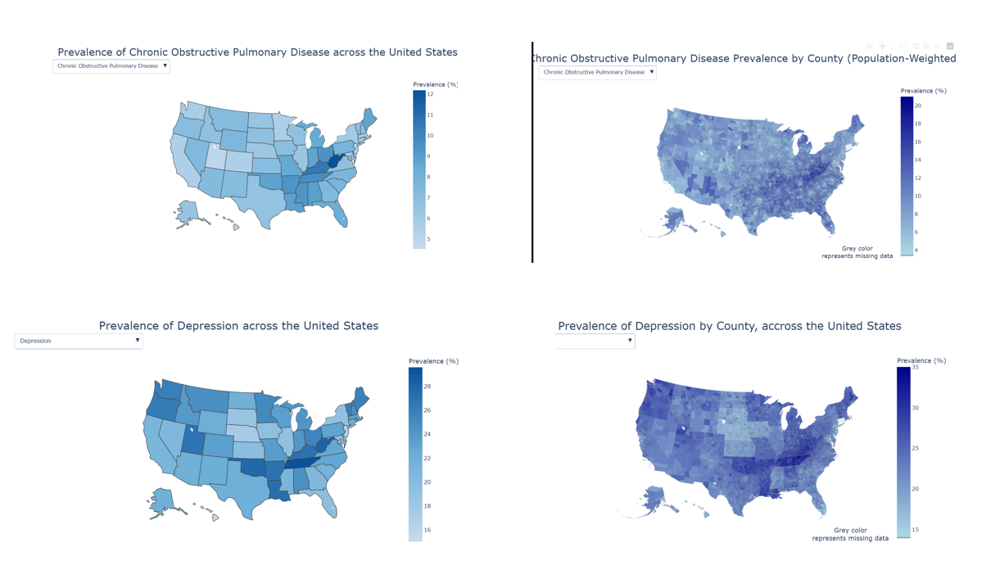



### References:


1]. Center for Disease Control and Prevention. Life Risk Factors. Available at: https://www.cdc.gov/nceh/tracking/topics/LifestyleRiskFactors.htm#:~:text=When%20examining%20chronic%20diseases%20and%20their%20potential%20connection,poor%20nutrition%2C%20tobacco%20use%2C%20and%20excessive%20alcohol%20use . Last updated: October 21, 2020.

[2]. Hacker K. (2024). The Burden of Chronic Disease. Mayo Clinic proceedings. Innovations, quality & outcomes, 8(1), 112–119. https://doi.org/10.1016/j.mayocpiqo.2023.08.005 

[3]. Data Brief 456. Mortality in the United States, 2021 (https://www.cdc.gov/nchs/data/databriefs/db456-tables.pdf#4 )